In [1]:
# -*- coding: utf-8 -*-
#  File: otus_adv_hw1_automl_atom.ipynb
#  Project: 'OTUS.ADV Homework #3'
#  Created by Gennady Matveev (gm@og.ly) on 10-02-2022.

# **$Homework$** **$3$**  
**OTUS Machine Learning Advanced**

### Time series clustering

![TS Clustering](https://docs.google.com/uc?export=download&id=1kP52pViswEsaHNrJUuCUxwXng4oBY3Cu)

Apply clustering algorithms to multiple time series (TS):
- A list of cryptocurrencies (CC), including Bitcoin (~100)
    - 30 days of closing prices
    - 3 days hourly closing prices
    - 1 hour minute closing prices
- Compare KNN (or similar) and DTW approaches;
- Try TS clustering after feature generation with TSFEL;
- Analyze composition of clusters without Bitcoin.

**Additional goals:**  

- Build risk profile for CC portfolios from one cluster and from
different clusters;
- Apply Matrix Profile methods from [matrixprofile](https://github.com/matrix-profile-foundation/matrixprofile) library  
to find repeated motifs and discords (anomalies) on CC from various clusters.

Goals:   

Apply clustering algorithms to multiple time series (TS):
- A list of cryptocurrencies (CC), including Bitcoin (~100)
    - 30 days of closing prices
    - 3 days hourly closing prices
    - 1 hour minute closing prices
- Compare KNN (or similar) and DTW approaches;
- Analyze composition of clusters without Bitcoin.

**Means:**  

- All meaningful computations will be done in [tslearn](https://github.com/tslearn-team/tslearn/) and [tsfel](https://github.com/fraunhoferportugal/tsfel). 

Data:
- CC prices will be downloaded with [cryptocompare](https://github.com/lagerfeuer/cryptocompare) library.

Abbreviations:
- TS: time series
- CC: cryptocurrency
- DTW: dynamic time warping
- H/P: hyperparameters

#### Open this notebook on mybinder.org

[![Binder](https://mybinder.org/badge_logo.svg)](https://mybinder.org/v2/gh/oort77/OTUS_ADV_HW3/main)  

#### Open in Colab (more hussle with uploading data from GitHub)

<a href="https://colab.research.google.com/github/oort77/OTUS_ADV_HW3/blob/main/notebooks/otus_adv_hw3_dtw.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### Google colab specific part

Please uncomment below to install dependencies in Colab.

In [2]:
# !pip install -r "https://drive.google.com/uc?export=download&id=1U0MrFc0NTLH2r5DihKjlIuelvTDDhz27"

![slice1](https://drive.google.com/uc?export=download&id=15ss2sr9Ecl7nNaeSMo7fI7Gkio713cZQ)

### Import libraries and setup notebook

In [3]:
# %load_ext nb_black
import os
import sys
import pandas as pd
import numpy as np
import warnings
from tqdm.autonotebook import tqdm
from IPython.core.display import display, HTML
warnings.filterwarnings("ignore")

/tmp/ipykernel_100820/819883381.py:7: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


#### Import utilities functions

In [4]:
if os.path.abspath("..") not in sys.path:
    sys.path.insert(0, os.path.abspath(".."))
url_utils = "https://drive.google.com/uc?export=download&id=1ABoJOtHSmvCnF9IRLaxJqhFXupmXzVmk"
if not os.path.exists("../src/"):
    os.mkdir("../src")
    gdown.download(url_utils, output="../src/utilities.py.zip")
    shutil.unpack_archive("../src/utilities.py", "../src")   
from src.utilities import *

#### Miscellaneius settings 

In [5]:
%matplotlib inline
display(HTML("<style>.container { width:80% !important; }</style>"))
%config InlineBackend.figure_format = 'retina'
plt.rcParams["figure.figsize"] = (10, 5)
plt.style.use("ggplot")
pd.options.display.precision = 4

#### ML parameters

In [6]:
random_state = 17
n_jobs = -1 
scaler = StandardScaler()

### Load data

#### Set up cryptocompare API

In [7]:
set_api_key()

#### Download data, top-100 CC by market cap

In [8]:
all_data = get_data()
data_day, data_hour, data_minute = all_data

BTC	OK
ETH	OK
XRP	OK
USDT	OK
BNB	OK
USDC	OK
SOL	OK
LUNA	OK
ADA	OK
AVAX	OK
DOT	OK
DOGE	OK
SHIB	OK
BUSD	OK
MATIC	OK
BIT	[ERROR] CCCAGG conversion does not exist for this coin pair
BIT passed
LINK	OK
AXS	OK
CRO	OK
FTT	OK
KLAY	OK
SAND	OK
UST	OK
WBTC	OK
GALA	OK
XLM	OK
UNI	OK
DAI	OK
ICP	OK
LTC	OK
ATOM	OK
DYDX	OK
NEAR	OK
TRX	OK
ALGO	OK
BCH	OK
MANA	OK
LEO	OK
OKB	OK
FTM	OK
VET	OK
CRV	OK
IMX	OK
EGLD	OK
HBAR	OK
ILV	OK
QNT	OK
ETC	OK
GRT	OK
XTZ	OK
THETA	OK
RLY	OK
GNO	OK
KCS	OK
FIL	OK
XMR	OK
YGG	OK
PCI	OK
AMP	OK
CELO	OK
ROSE	OK
HNT	OK
MC	OK
AAVE	OK
1INCH	OK
EOS	OK
ONE	OK
FXS	OK
MIOTA	OK
VELO	OK
FLOW	OK
CEL	OK
CVX	OK
MINA	OK
XDC	OK
CAKE	OK
NEO	OK
XRD	OK
HT	OK
AR	OK
NEXO	OK
RBN	OK
OMI	OK
NU	OK
RUNE	OK
ANC	OK
SPELL	OK
RAY	OK
XCH	OK
MKR	OK
STX	OK
DFI	OK
CHZ	OK
RSR	OK
BSV	OK
ENJ	OK
ENS	OK
KSM	OK
SFM	[ERROR] There is no data for the toSymbol USD .
SFM passed
JASMY	OK
BTC	OK
ETH	OK
XRP	OK
USDT	OK
BNB	OK
USDC	OK
SOL	OK
LUNA	OK
ADA	OK
AVAX	OK
DOT	OK
DOGE	OK
SHIB	OK
BUSD	OK
MATIC	OK
BIT	[ERROR] CCCAGG convers

#### Save data to pickles

In [9]:
pickle_data(data_day, data_hour, data_minute)

![slice2](https://drive.google.com/uc?export=download&id=1Bapr76q9lODV4LnZ3WEbHH_TO0_udMaC)

### CC data - visual check

In [10]:
data_day.head()

,BTC,ETH,XRP,USDT,BNB,USDC,SOL,LUNA,ADA,AVAX,...,MKR,STX,DFI,CHZ,RSR,BSV,ENJ,ENS,KSM,JASMY
0,43088.74,3328.63,0.7796,1.000,494.66,0.9996,147.74,87.30,1.292,93.08,...,2215.59,2.135,3.102,0.2669,0.0268,112.63,2.452,26.68,289.60,0.0703
1,43100.36,3349.61,0.7785,1.001,498.67,1.0000,147.96,87.11,1.412,92.32,...,2257.85,2.130,3.146,0.2698,0.0267,112.62,2.504,27.65,277.78,0.0706
2,42224.38,3210.90,0.7623,1.001,475.45,1.0000,139.84,77.13,1.603,86.66,...,2096.15,2.071,3.041,0.2569,0.0252,109.87,2.328,24.33,259.22,0.0664
3,42372.75,3161.50,0.7517,1.001,471.43,1.0000,141.29,80.77,1.459,86.02,...,2061.90,2.338,3.014,0.2593,0.0250,108.60,2.279,23.39,253.52,0.0648
4,41674.80,3084.78,0.7382,1.000,462.11,1.0000,135.30,81.20,1.337,82.64,...,1996.62,2.069,2.974,0.2463,0.0236,109.56,2.220,22.14,243.51,0.0716


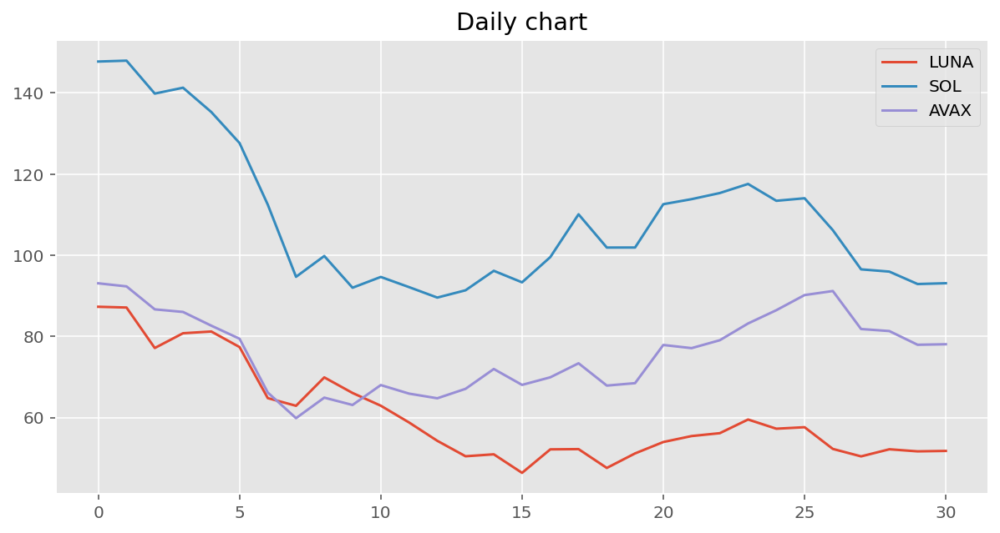

In [11]:
_ = data_day[["LUNA", "SOL", "AVAX"]].plot(title="Daily chart", figsize=(10, 5))

In [12]:
data_hour.head()

,BTC,ETH,XRP,USDT,BNB,USDC,SOL,LUNA,ADA,AVAX,...,MKR,STX,DFI,CHZ,RSR,BSV,ENJ,ENS,KSM,JASMY
0,43606.87,3104.78,0.8176,1.001,416.36,1.0000,106.51,54.33,1.159,90.23,...,2117.88,1.623,3.654,0.2260,0.0208,100.16,2.021,18.94,181.62,0.0401
1,43820.79,3125.58,0.8245,1.001,417.17,1.0000,107.76,54.64,1.163,91.34,...,2127.23,1.625,3.667,0.2282,0.0213,100.57,2.049,19.09,183.08,0.0401
2,43557.82,3096.59,0.8218,1.001,415.15,1.0000,107.18,53.92,1.156,90.42,...,2113.36,1.615,3.685,0.2260,0.0210,99.79,2.034,18.98,182.12,0.0397
3,43699.43,3105.27,0.8196,1.001,415.22,0.9999,106.90,54.25,1.158,90.80,...,2112.22,1.610,3.689,0.2321,0.0210,99.85,2.043,18.97,182.40,0.0396
4,43613.48,3095.38,0.8116,1.001,414.84,1.0000,105.96,54.11,1.154,89.77,...,2103.43,1.607,3.653,0.2273,0.0208,99.22,2.029,18.75,181.43,0.0396


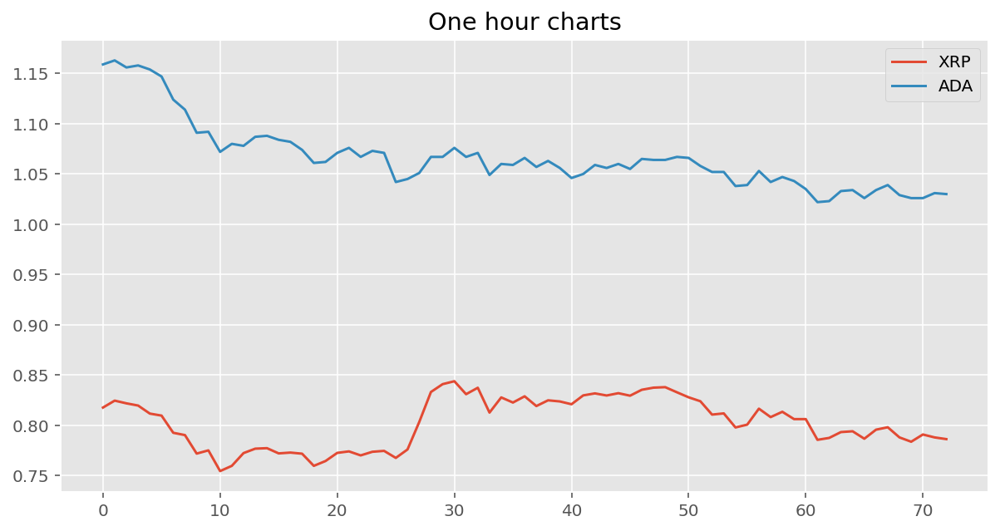

In [13]:
_ = data_hour[["XRP", "ADA"]].plot(title="One hour charts", figsize=(10, 5))

In [14]:
data_minute.head()

,BTC,ETH,XRP,USDT,BNB,USDC,SOL,LUNA,ADA,AVAX,...,MKR,STX,DFI,CHZ,RSR,BSV,ENJ,ENS,KSM,JASMY
0,42249.16,2874.78,0.7911,1.001,395.83,0.9999,92.68,51.97,1.026,78.44,...,1898.91,1.417,3.441,0.1983,0.0175,91.98,1.712,16.58,163.99,0.0301
1,42247.23,2874.64,0.7913,1.000,396.02,0.9999,92.70,51.96,1.027,78.41,...,1884.90,1.417,3.441,0.1981,0.0177,91.87,1.712,16.56,163.52,0.0302
2,42240.57,2874.34,0.7915,1.001,396.22,1.0000,92.69,51.96,1.026,78.57,...,1883.56,1.418,3.440,0.1985,0.0177,91.86,1.717,16.57,163.55,0.0301
3,42224.73,2873.45,0.7915,1.000,396.28,0.9999,92.66,52.01,1.026,78.54,...,1898.87,1.418,3.439,0.1985,0.0173,91.97,1.713,16.56,163.45,0.0301
4,42207.53,2872.53,0.7911,1.001,396.16,1.0000,92.60,52.01,1.026,78.56,...,1882.66,1.417,3.434,0.1983,0.0173,91.89,1.712,16.54,163.43,0.0301


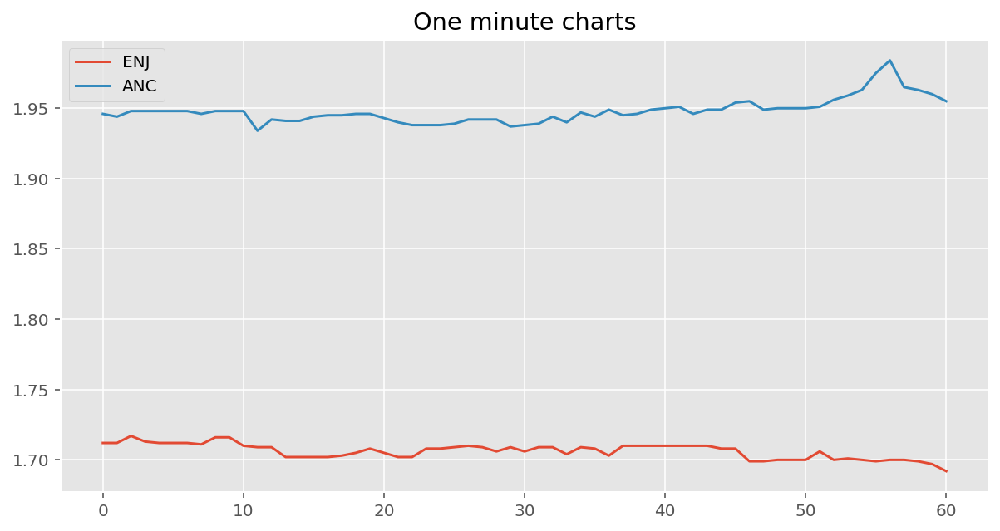

In [15]:
_ = data_minute[["ENJ", "ANC"]].plot(title="One minute charts", figsize=(10, 5))

![slice3](https://drive.google.com/uc?export=download&id=1Xvrbtz-xHvvk2Tmxtx0B3j-PP2GEjuOD) 

### Run clustering study with TSLEARN TimeSeriesKMeans

#### Daily charts

##### KNeighbours, euclidean metric

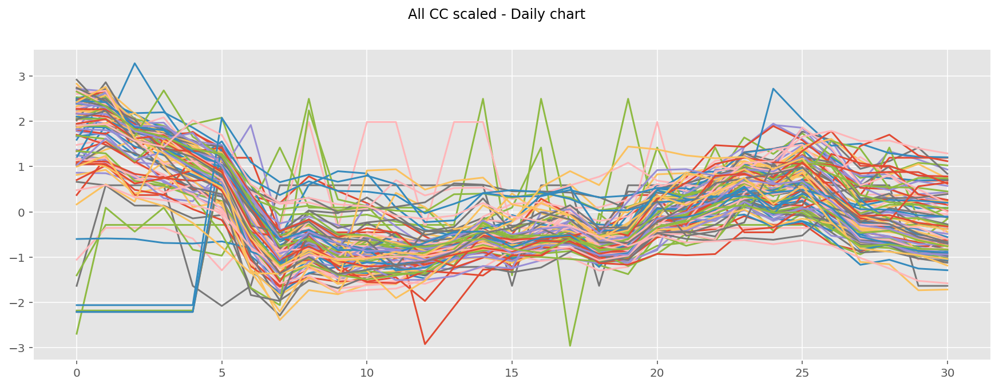

  0%|          | 0/8 [00:00<?, ?it/s]

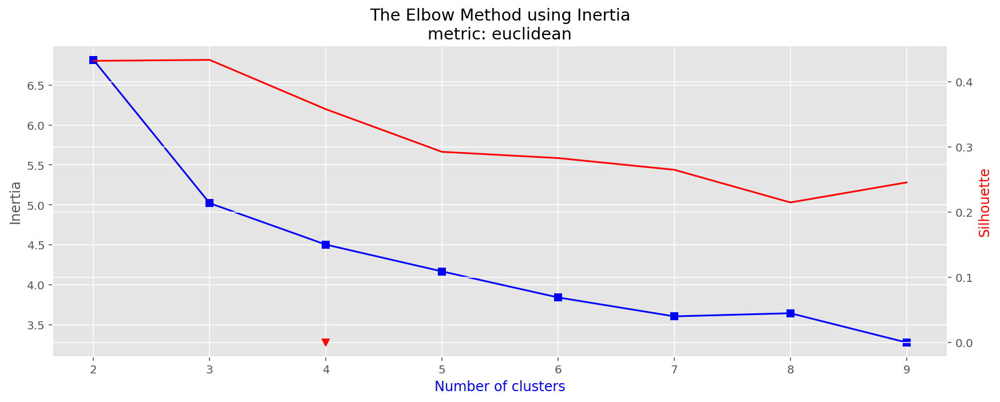

Optimal number of clusters: 4


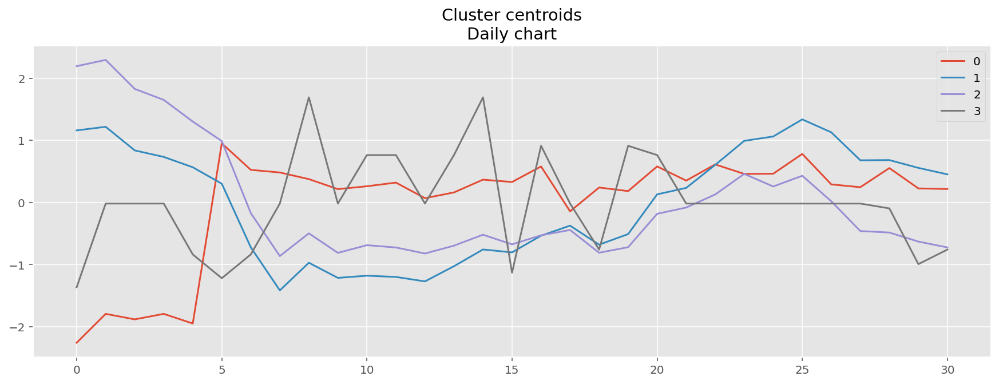

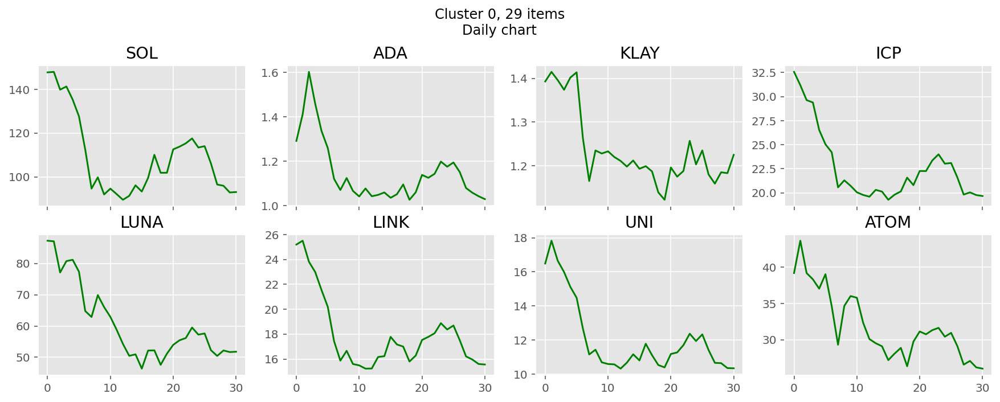

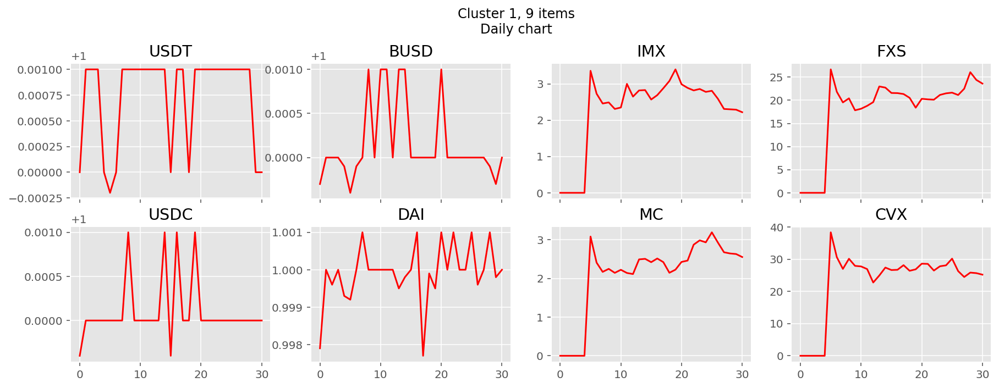

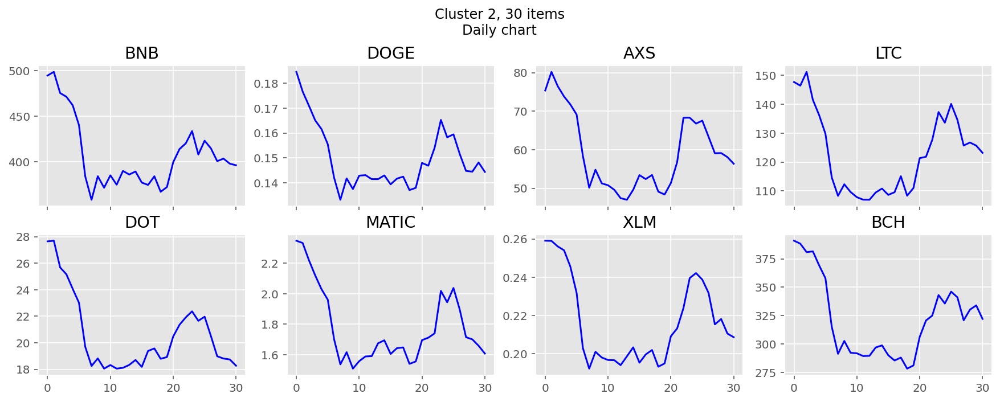

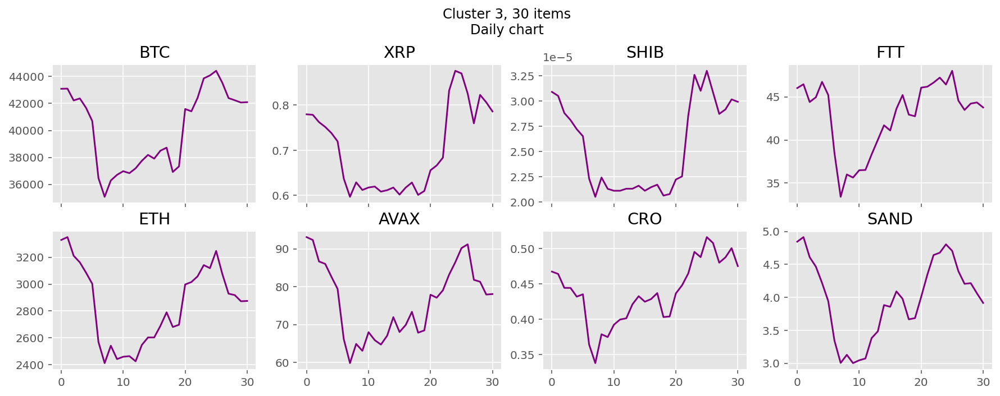

In [16]:
clustering_study(data_day, metric="euclidean", title="Daily chart")

![slice3](https://drive.google.com/uc?export=download&id=1Xvrbtz-xHvvk2Tmxtx0B3j-PP2GEjuOD) 

##### KNeighbours, DTW

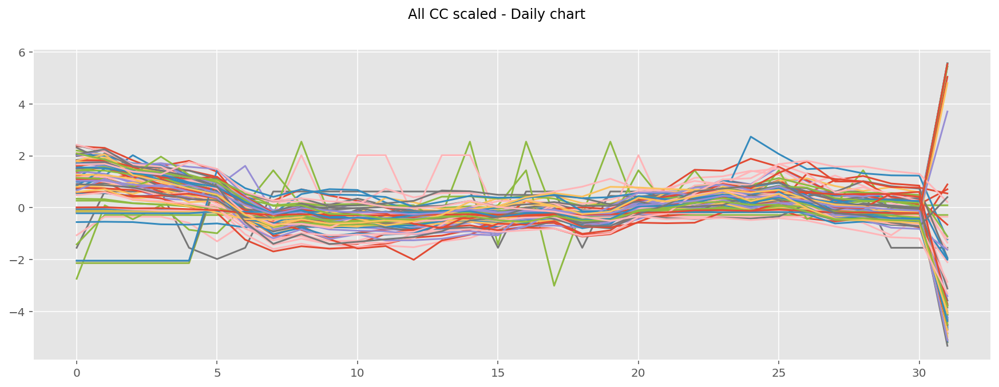

  0%|          | 0/8 [00:00<?, ?it/s]

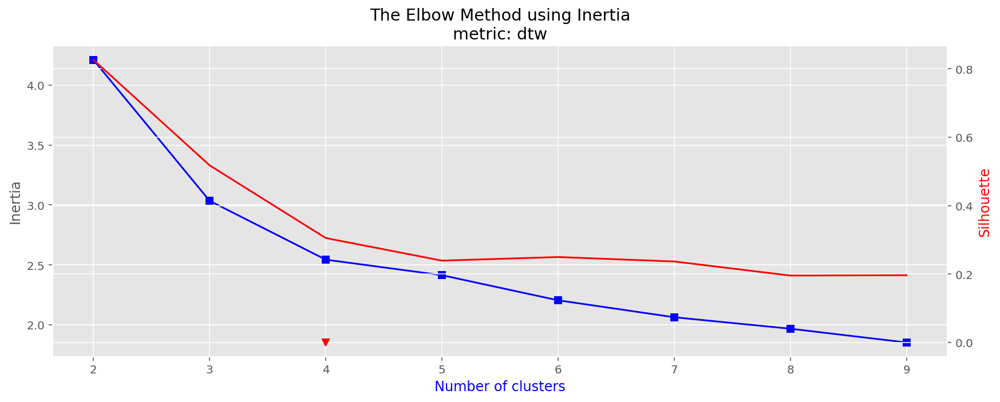

Optimal number of clusters: 4


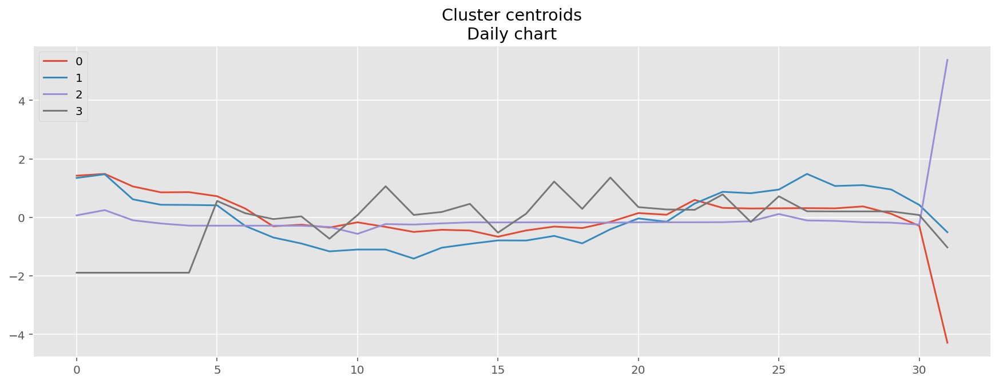

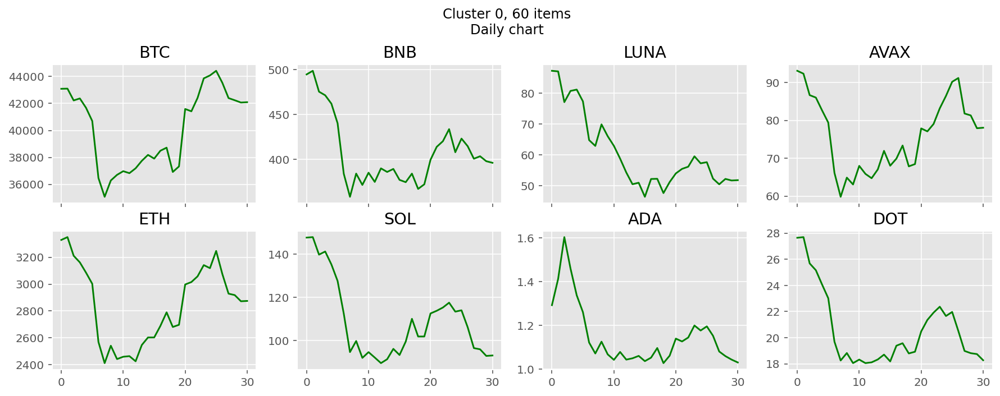

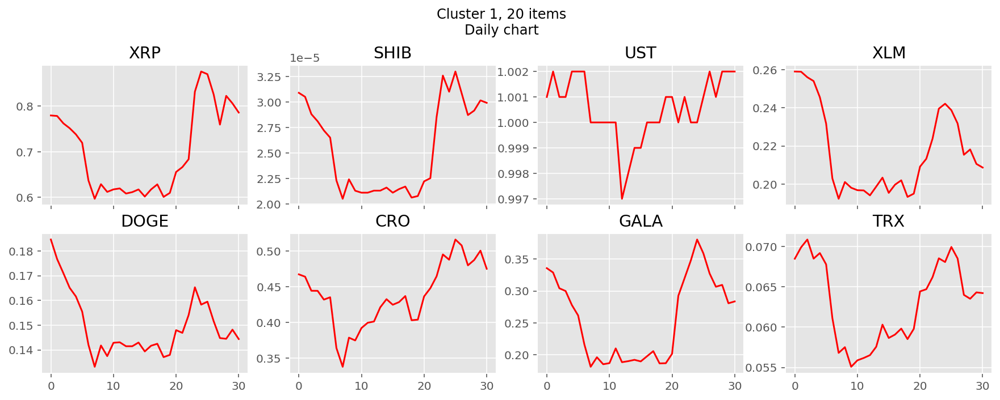

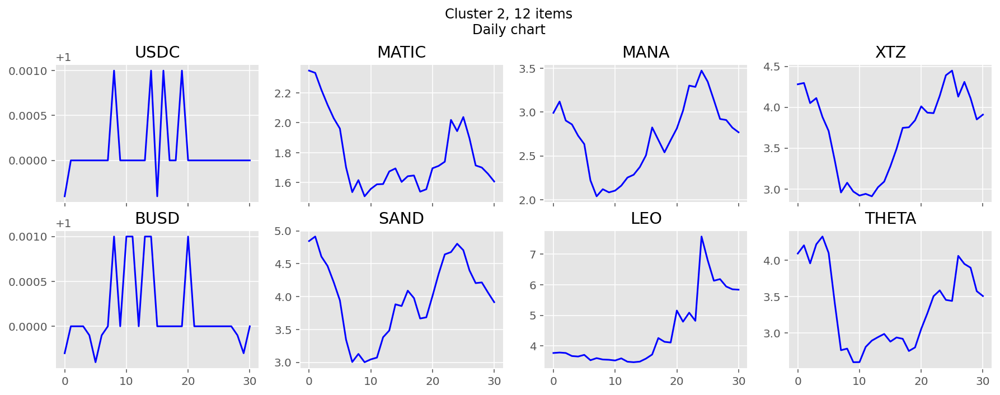

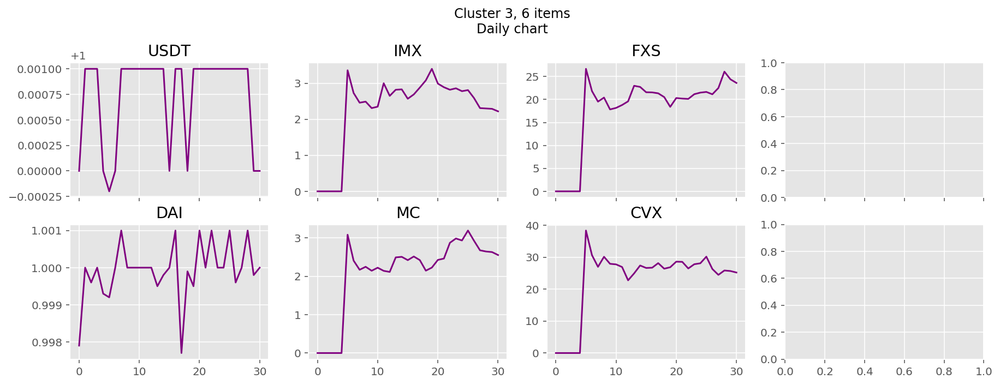

In [17]:
clustering_study(data_day, metric="dtw", title="Daily chart")

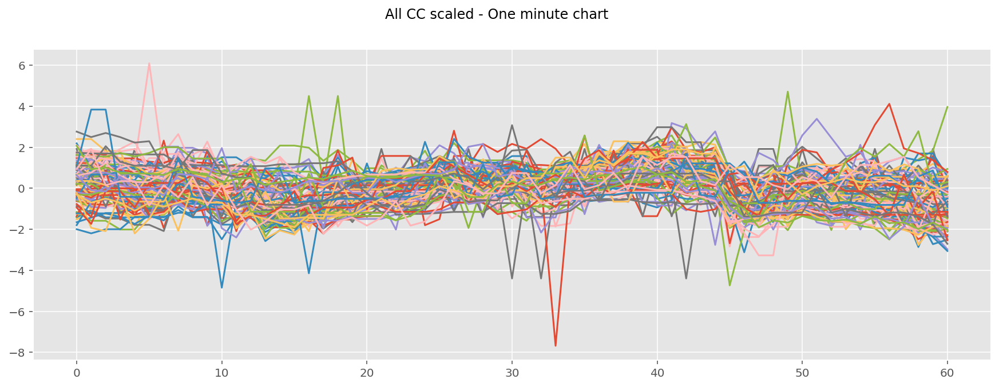

  0%|          | 0/8 [00:00<?, ?it/s]

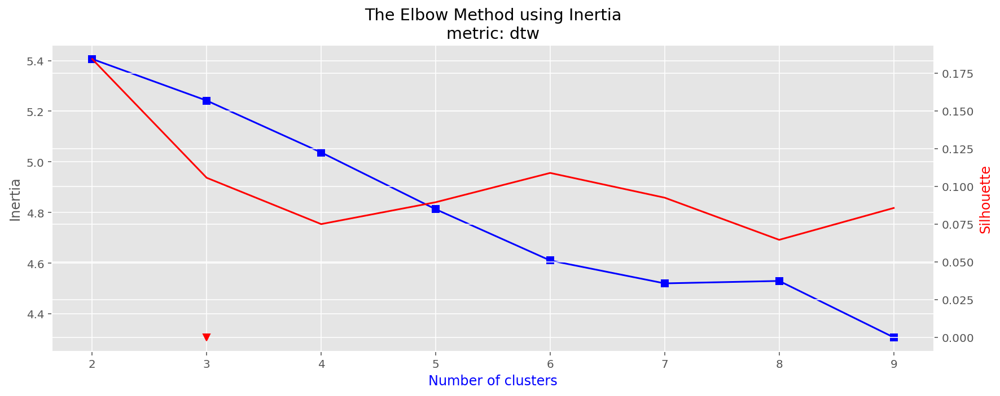

Optimal number of clusters: None


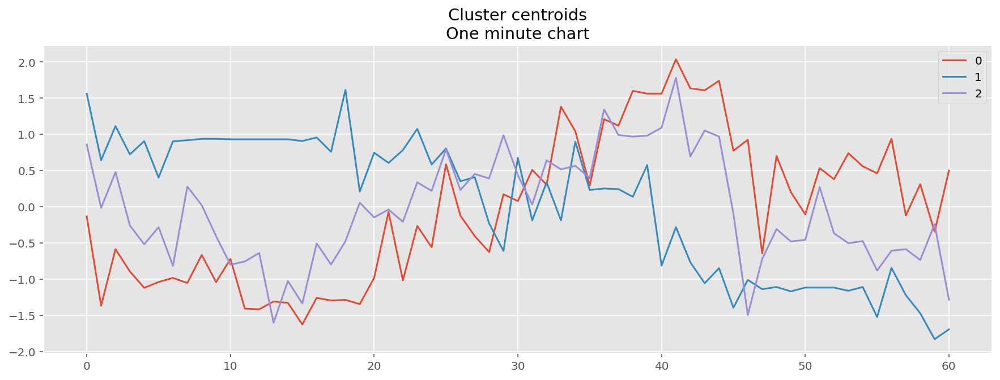

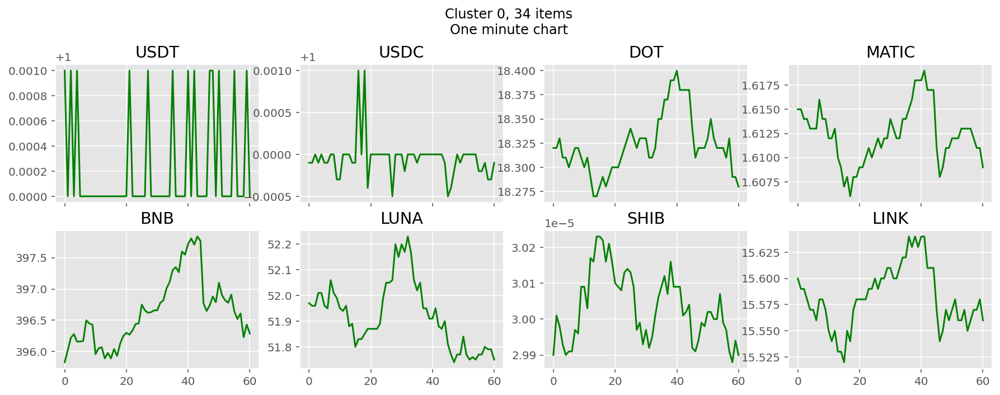

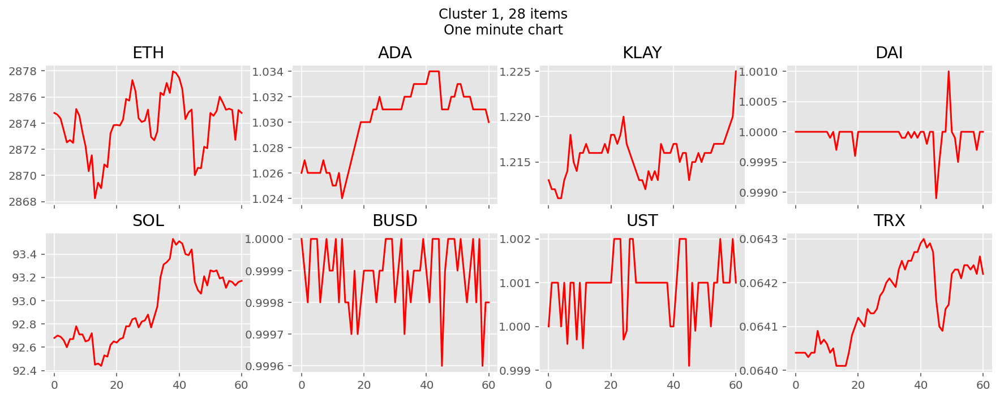

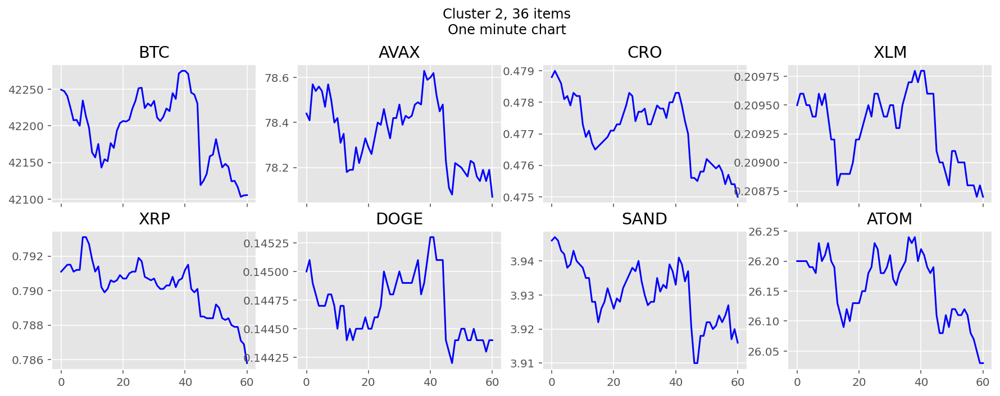

In [18]:
clustering_study(data_minute, metric="dtw", title="One minute chart")

![slice4](https://drive.google.com/uc?export=download&id=1qFbd7HLrG88o7RbgexFUygDR2LP82O7-)

#### One hour charts

##### KNeighbours, euclidean metric

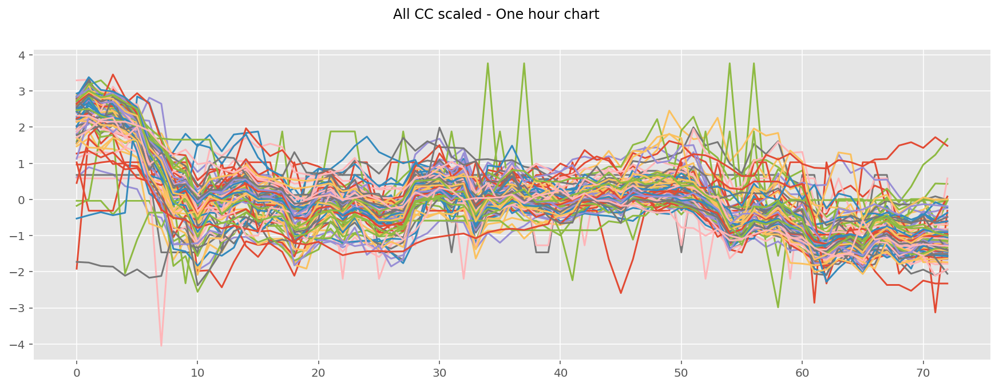

  0%|          | 0/8 [00:00<?, ?it/s]

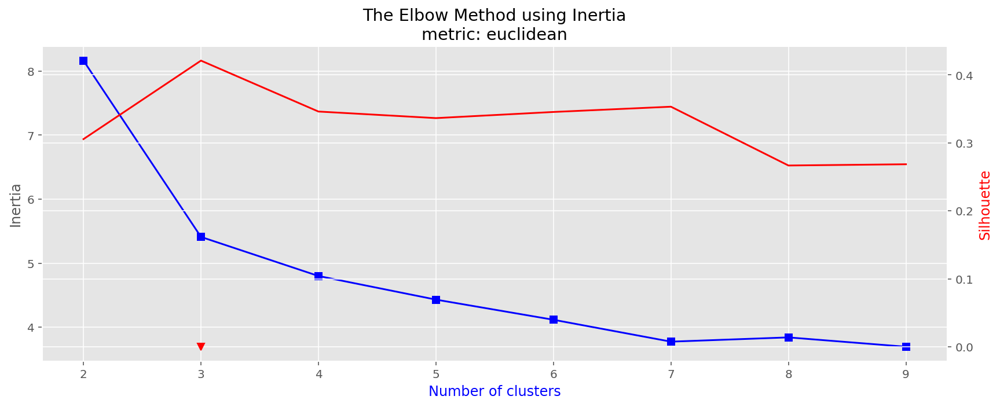

Optimal number of clusters: 3


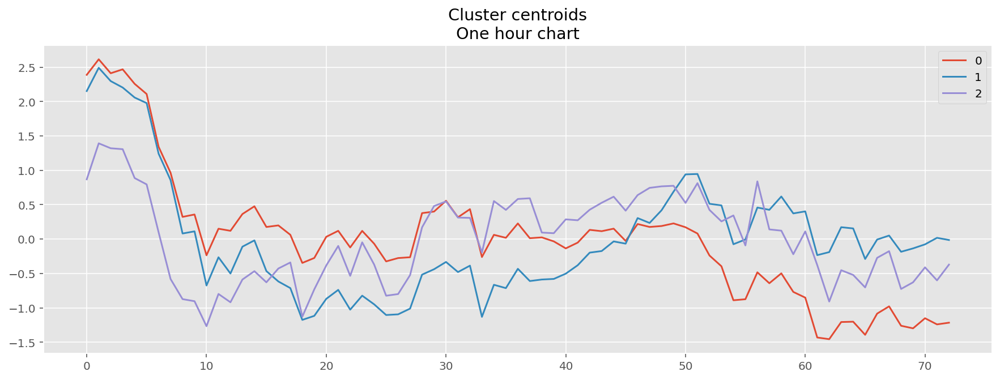

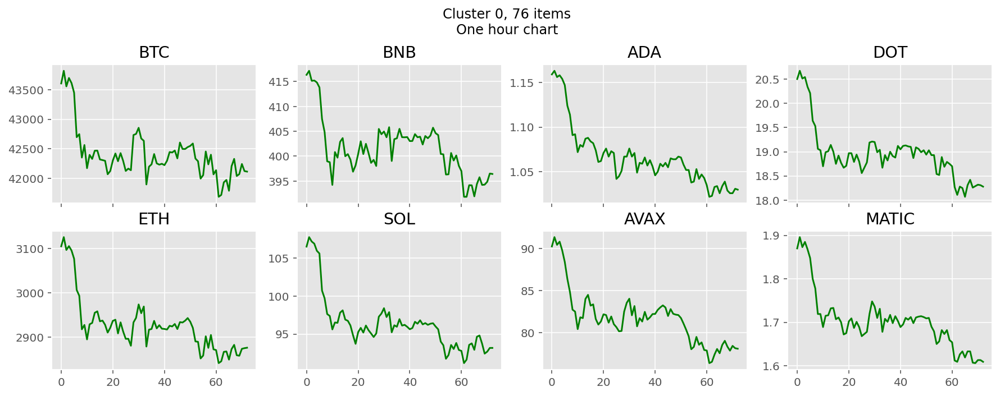

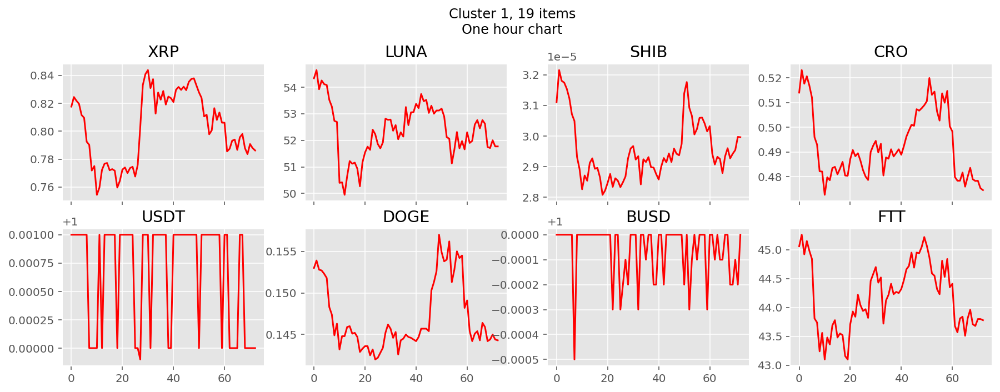

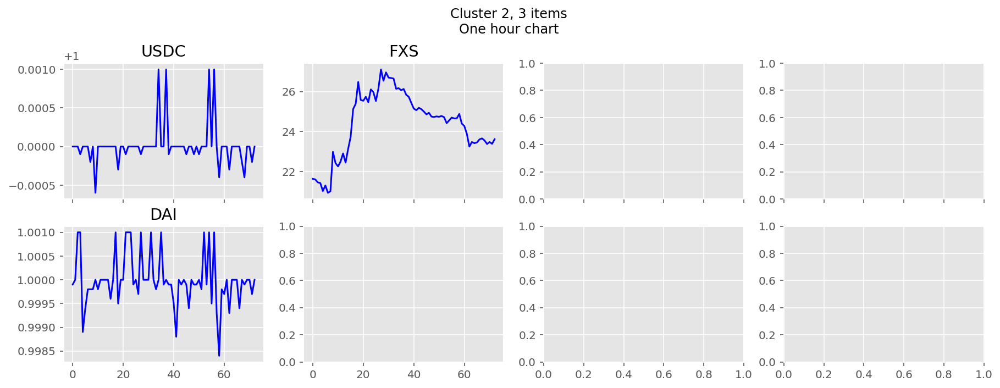

In [19]:
clustering_study(data_hour, metric="euclidean", title="One hour chart")

![slice6](https://drive.google.com/uc?export=download&id=1updrFKIPTzfVguR8_FQ8kTklpbvIrDqo)

##### KNeighbours, DTW

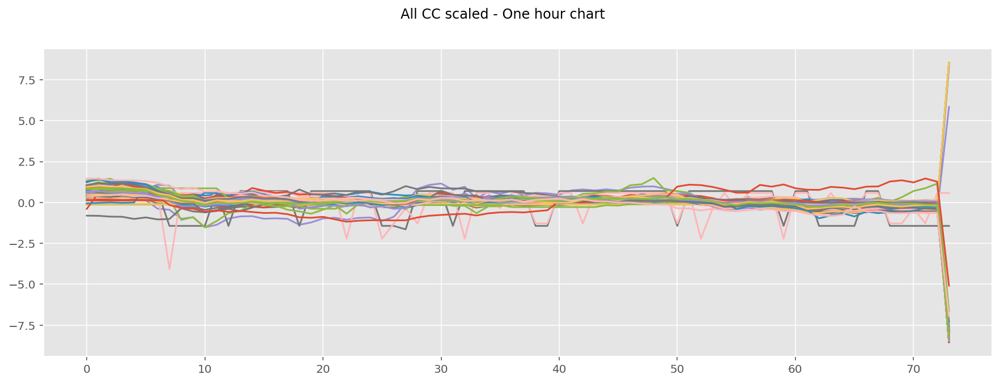

  0%|          | 0/8 [00:00<?, ?it/s]

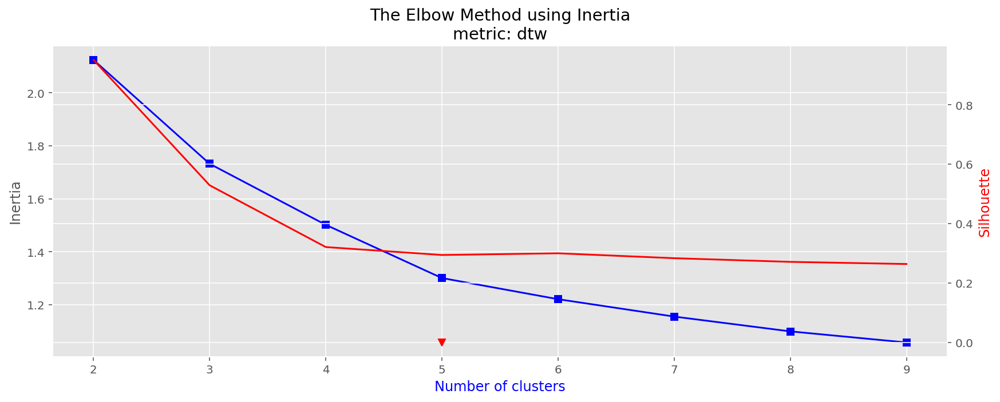

Optimal number of clusters: 5


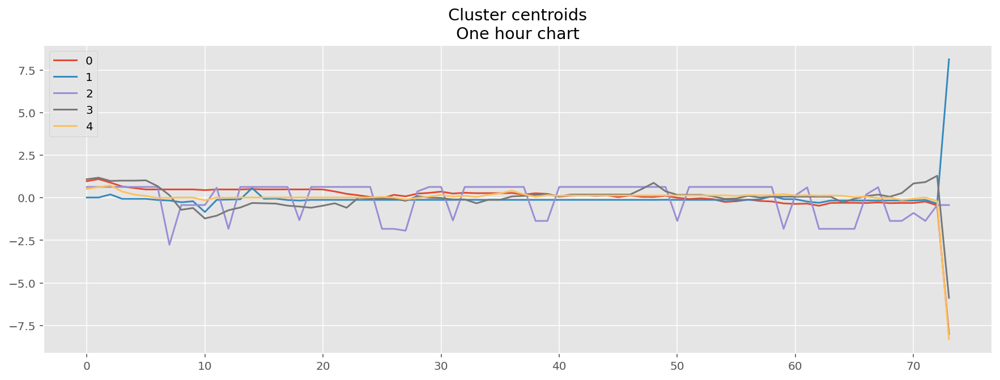

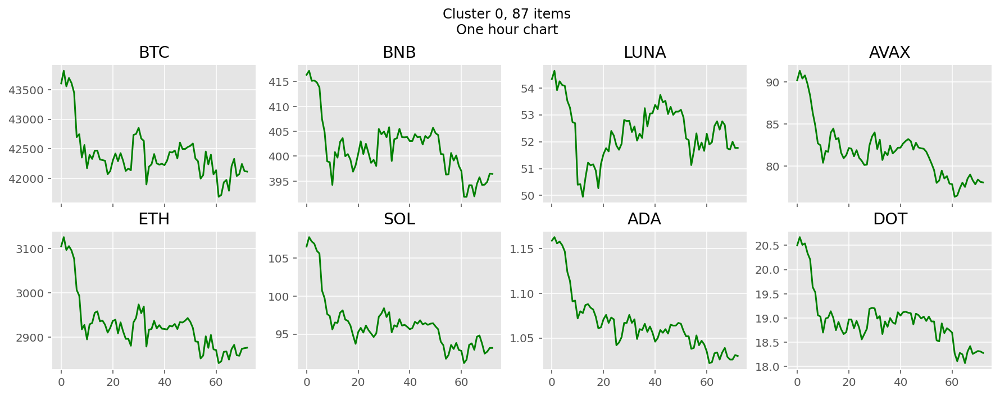

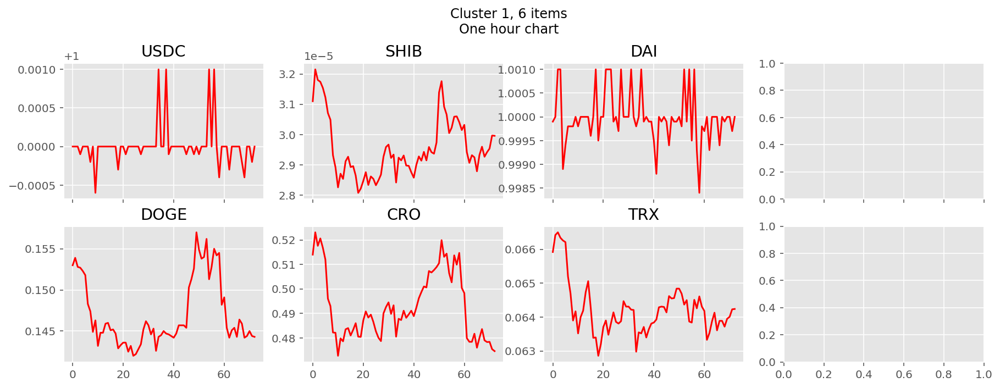

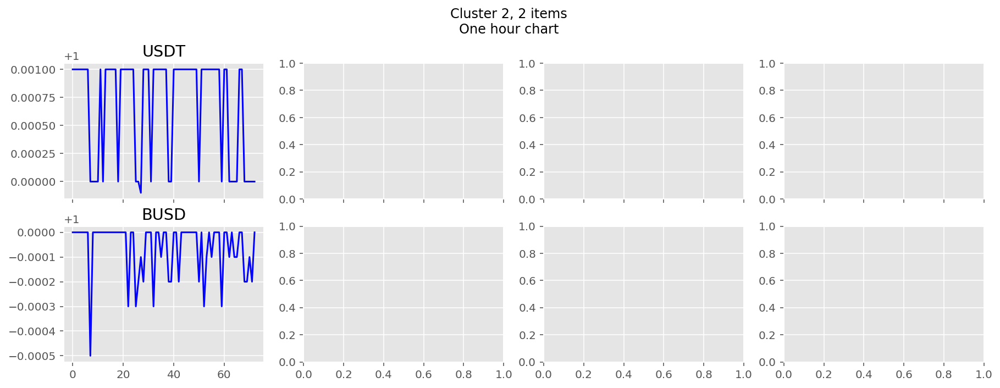

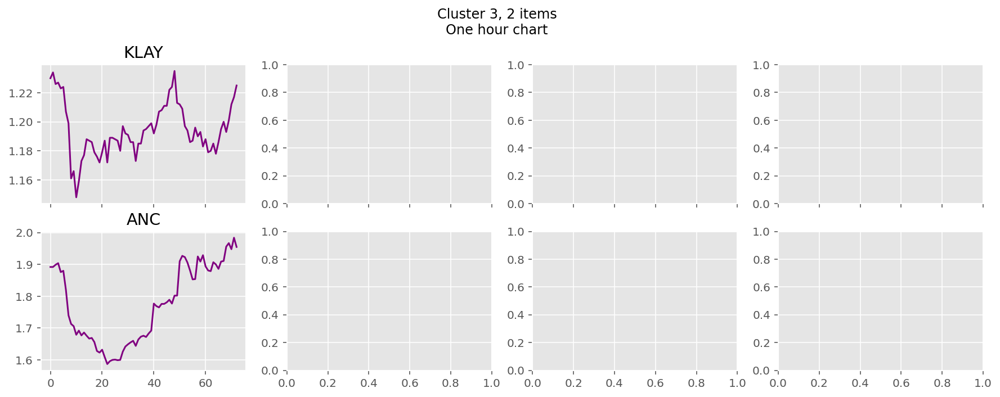

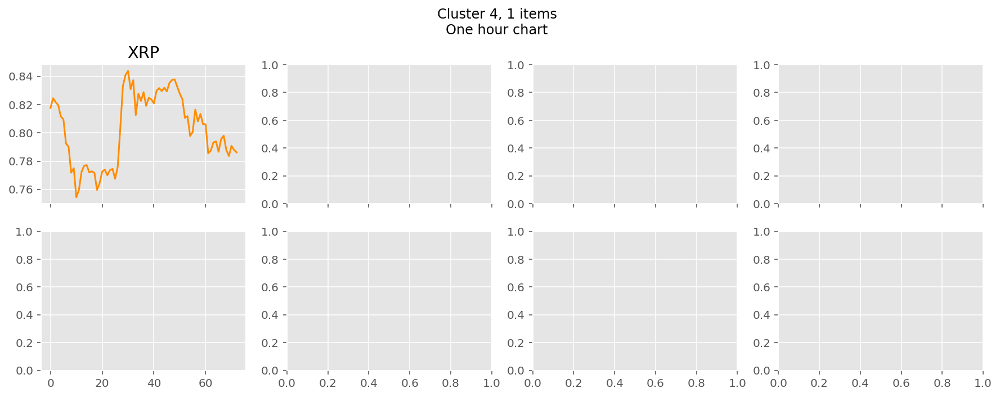

In [20]:
clustering_study(data_hour, metric="dtw", title="One hour chart")

![slice1](https://drive.google.com/uc?export=download&id=15ss2sr9Ecl7nNaeSMo7fI7Gkio713cZQ)


#### One minute charts

##### KNeighbours, euclidean metric

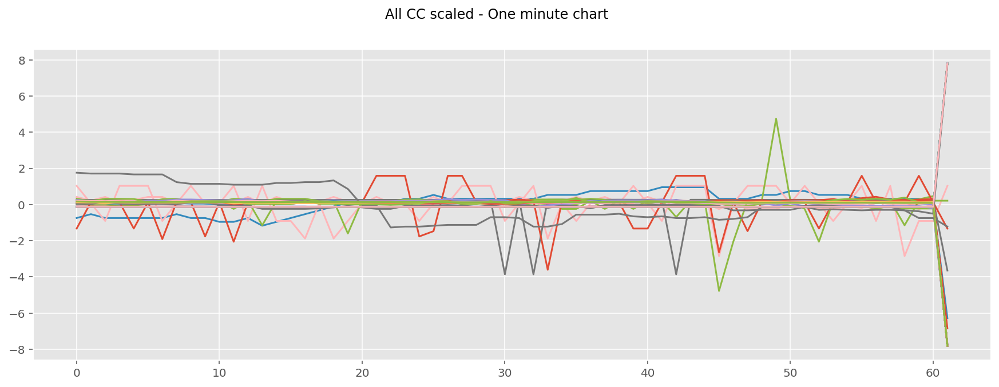

  0%|          | 0/8 [00:00<?, ?it/s]

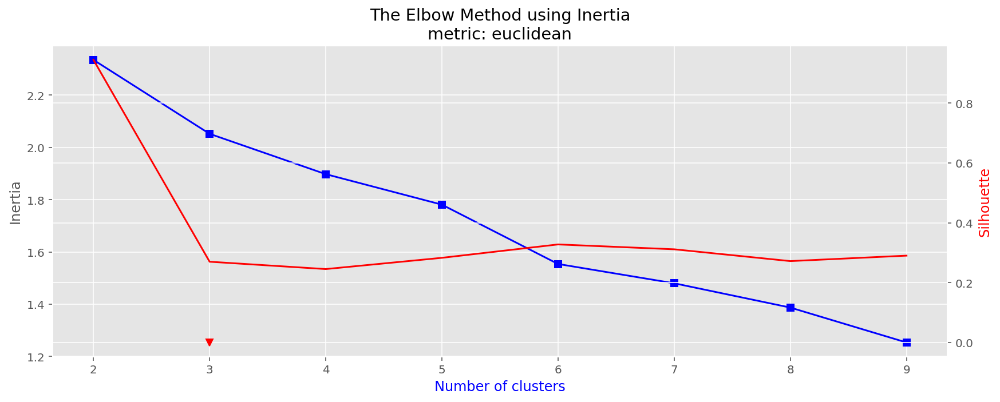

Optimal number of clusters: None


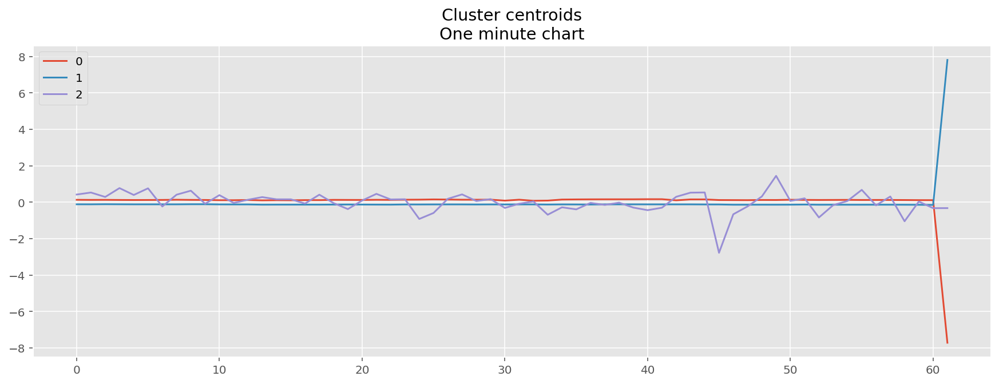

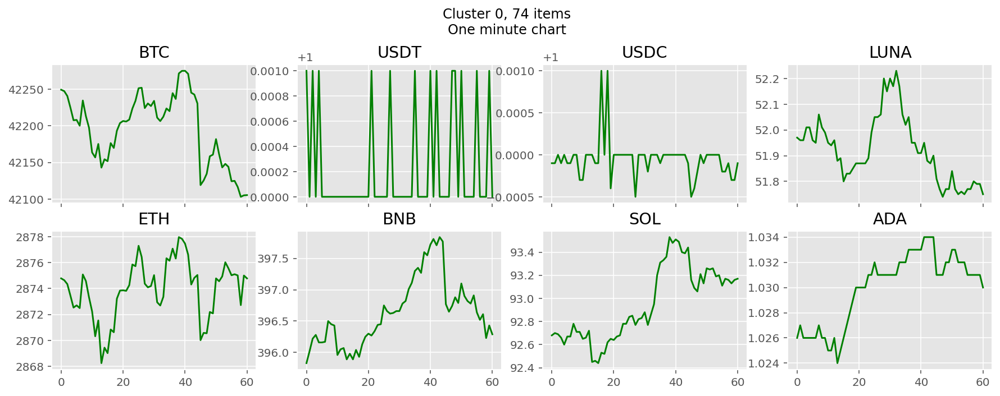

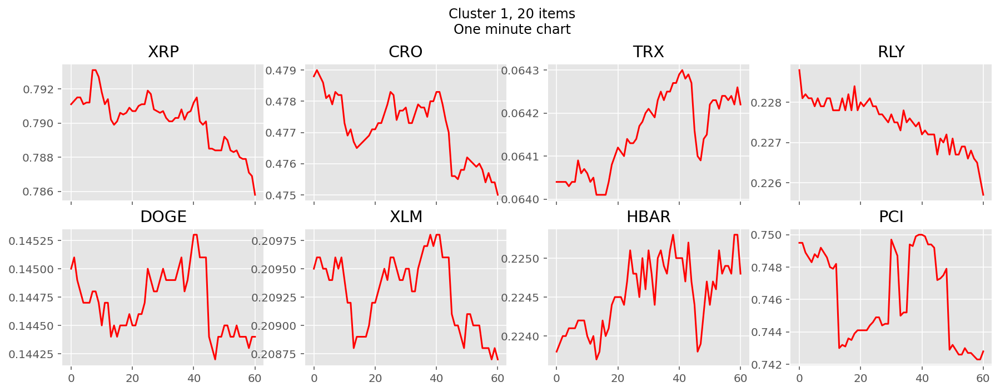

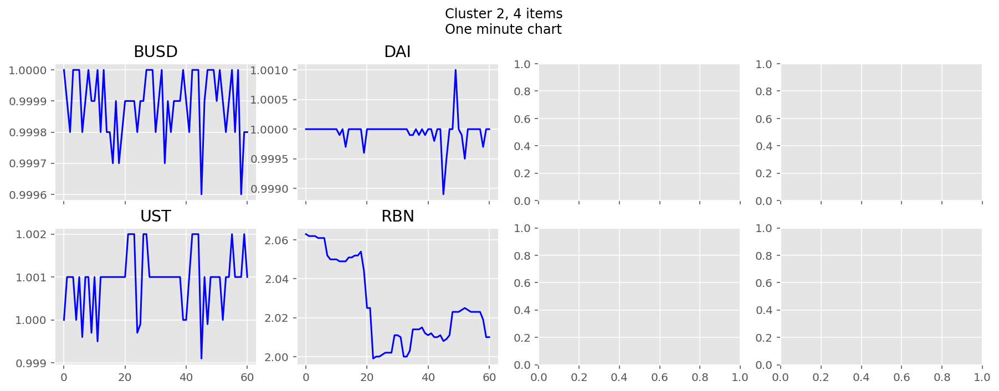

In [21]:
clustering_study(data_minute, metric="euclidean", title="One minute chart")

![slice2](https://drive.google.com/uc?export=download&id=1Bapr76q9lODV4LnZ3WEbHH_TO0_udMaC)

##### KNeighbours, DTW

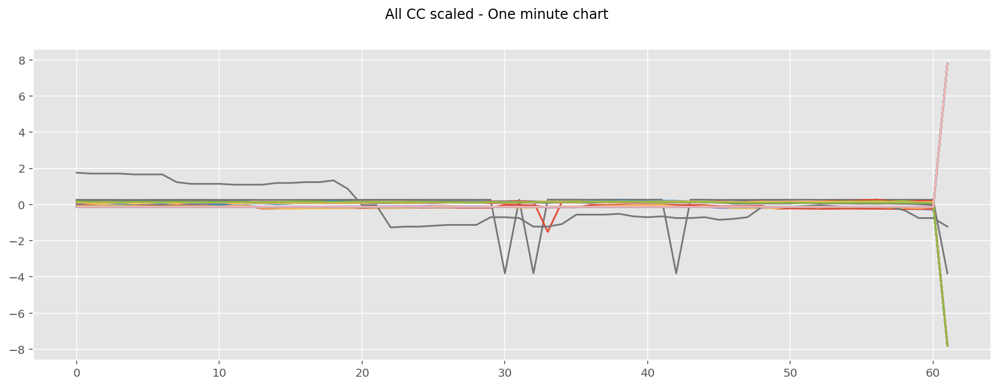

  0%|          | 0/8 [00:00<?, ?it/s]

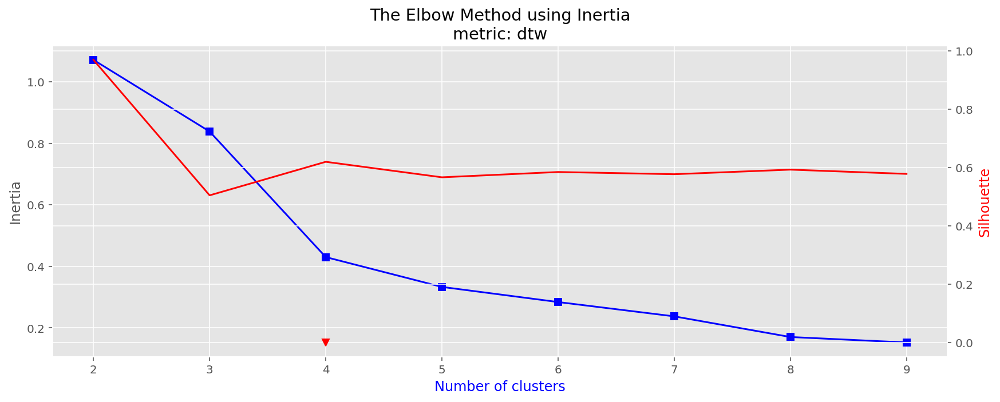

Optimal number of clusters: 4


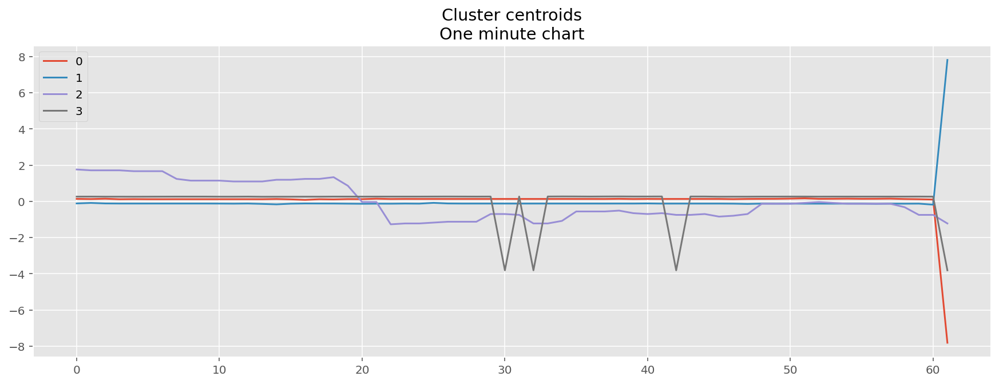

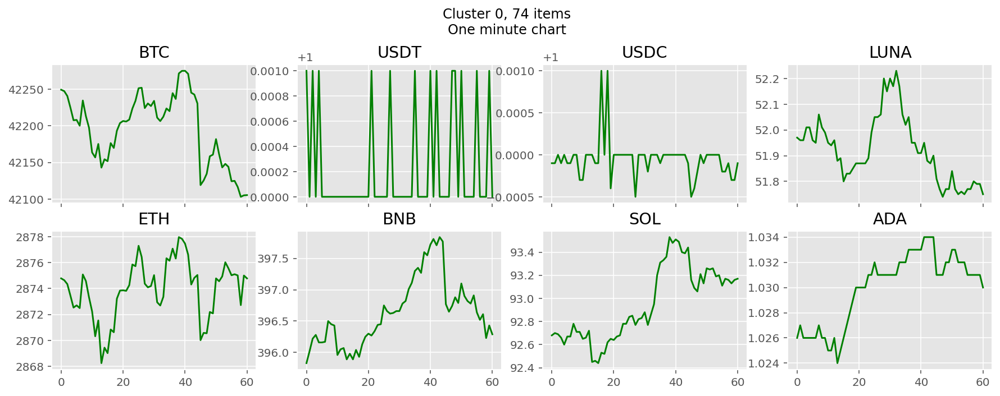

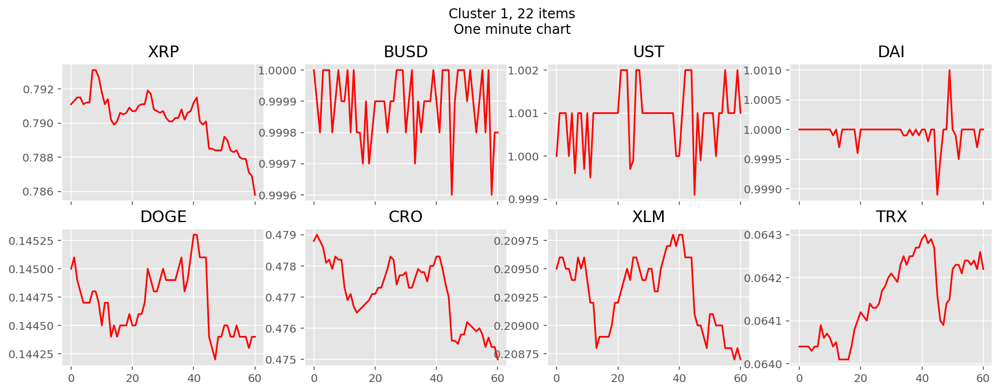

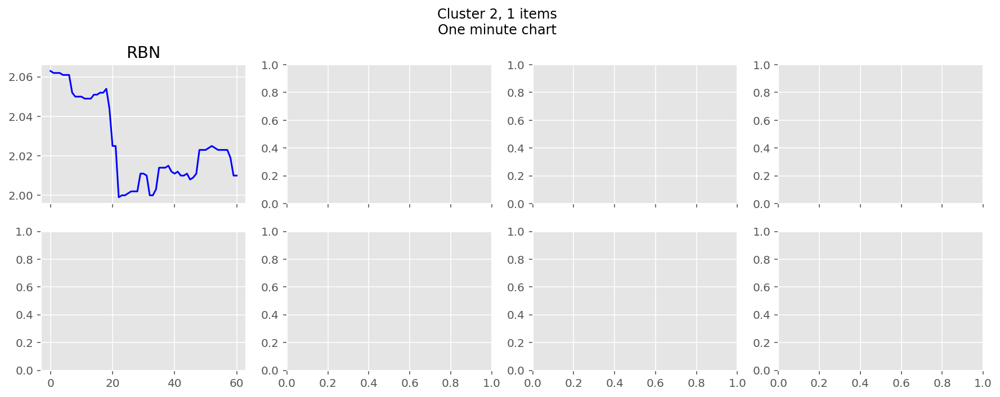

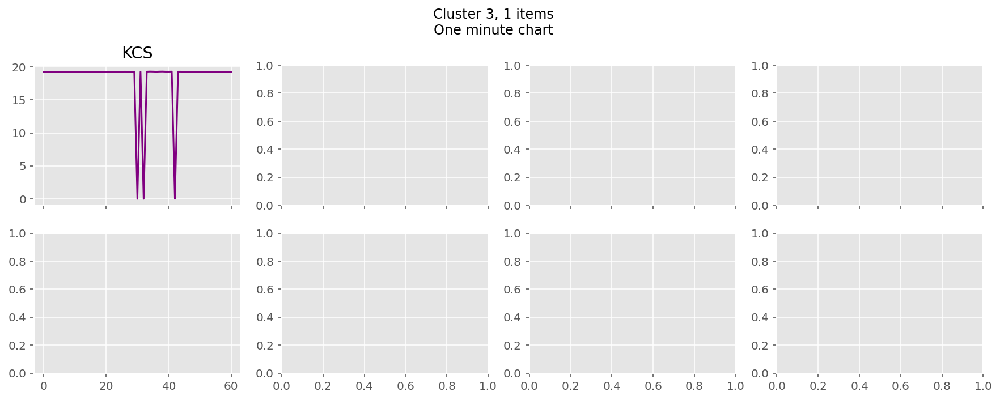

In [22]:
clustering_study(data_minute, metric="dtw", title="One minute chart")

![slice2](https://drive.google.com/uc?export=download&id=1Bapr76q9lODV4LnZ3WEbHH_TO0_udMaC)
![slice3](https://drive.google.com/uc?export=download&id=1Xvrbtz-xHvvk2Tmxtx0B3j-PP2GEjuOD)  
![slice4](https://drive.google.com/uc?export=download&id=1qFbd7HLrG88o7RbgexFUygDR2LP82O7-)

###  Clustering analysis with TSFEL

#### Choose domain: statistical, temporal, spectral or all combined

In [23]:
# Uncomment the line with a chosen domain

# cfg_file = tsfel.get_features_by_domain()  # All features will be extracted.
# cgf_file = tsfel.get_features_by_domain("statistical")  # All statistical domain features will be extracted
cfg_file = tsfel.get_features_by_domain("temporal")     # All temporal domain features will be extracted
# cfg_file = tsfel.get_features_by_domain("spectral")     # All spectral domain features will be extracted

In [24]:
data_day.head()

,BTC,ETH,XRP,USDT,BNB,USDC,SOL,LUNA,ADA,AVAX,...,MKR,STX,DFI,CHZ,RSR,BSV,ENJ,ENS,KSM,JASMY
0,43088.74,3328.63,0.7796,1.000,494.66,0.9996,147.74,87.30,1.292,93.08,...,2215.59,2.135,3.102,0.2669,0.0268,112.63,2.452,26.68,289.60,0.0703
1,43100.36,3349.61,0.7785,1.001,498.67,1.0000,147.96,87.11,1.412,92.32,...,2257.85,2.130,3.146,0.2698,0.0267,112.62,2.504,27.65,277.78,0.0706
2,42224.38,3210.90,0.7623,1.001,475.45,1.0000,139.84,77.13,1.603,86.66,...,2096.15,2.071,3.041,0.2569,0.0252,109.87,2.328,24.33,259.22,0.0664
3,42372.75,3161.50,0.7517,1.001,471.43,1.0000,141.29,80.77,1.459,86.02,...,2061.90,2.338,3.014,0.2593,0.0250,108.60,2.279,23.39,253.52,0.0648
4,41674.80,3084.78,0.7382,1.000,462.11,1.0000,135.30,81.20,1.337,82.64,...,1996.62,2.069,2.974,0.2463,0.0236,109.56,2.220,22.14,243.51,0.0716


![slice5](https://drive.google.com/uc?export=download&id=1tO_u4a_RioPUolVviZLhJrriXe7kZ3XO) 

#### Temporal domain

##### Extract features in chosen domain

In [25]:
# *****************************************************
# data_day = pd.read_pickle("../data/data_100_days.pickle")

In [26]:
# Get list of features names
x_temp = tsfel.time_series_features_extractor(cfg_file, data_day["BTC"], window_size=30) # <--------------------- 30
tf_columns = x_temp.columns
xtf = pd.DataFrame(columns=data_day.columns, index=tf_columns)

# Scale prices?
dd = data_day.copy()
dd = pd.DataFrame(scaler.fit_transform(dd), columns=dd.columns, index=dd.index)

# Fill df with features
for col in xtf.columns:
    xtf[col] = tsfel.time_series_features_extractor(
        cfg_file, data_day[col], window_size=30 # <--------------------- 30
    ).T
xtf.dropna(inplace=True)
Xt = pd.DataFrame(scaler.fit_transform(xtf), columns=data_day.columns, index=xtf.index)

*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***


##### Check features dataset

In [27]:
Xt.head()

,BTC,ETH,XRP,USDT,BNB,USDC,SOL,LUNA,ADA,AVAX,...,MKR,STX,DFI,CHZ,RSR,BSV,ENJ,ENS,KSM,JASMY
0_Absolute energy,0.8456,0.8456,0.6033,0.7656,0.8456,0.7622,0.8455,0.8455,0.7726,0.8455,...,0.8456,0.8140,0.8368,-0.2368,-0.3328,0.8455,0.8255,0.8451,0.8455,-0.3478
0_Area under the curve,-0.3670,-0.3670,-0.5096,-0.4247,-0.3670,-0.4299,-0.3670,-0.3670,-0.4402,-0.3670,...,-0.3670,-0.4032,-0.3767,-0.4248,-0.3338,-0.3670,-0.3893,-0.3672,-0.3670,-0.3569
0_Autocorrelation,0.8456,0.8456,0.6033,0.7656,0.8456,0.7622,0.8455,0.8455,0.7726,0.8455,...,0.8456,0.8140,0.8368,-0.2368,-0.3328,0.8455,0.8255,0.8451,0.8455,-0.3478
0_Centroid,-0.3670,-0.3670,-0.5133,-0.4305,-0.3670,-0.4357,-0.3671,-0.3672,-0.4463,-0.3672,...,-0.3670,-0.4083,-0.3799,-0.4134,-0.3151,-0.3671,-0.3938,-0.3678,-0.3671,-0.3430
0_Entropy,-0.3670,-0.3670,-0.4500,-0.4288,-0.3670,-0.4341,-0.3671,-0.3672,-0.4205,-0.3672,...,-0.3670,-0.3954,-0.3760,-0.2860,-0.1889,-0.3671,-0.3842,-0.3677,-0.3671,-0.2109


##### Distribution of distances in time features dataset

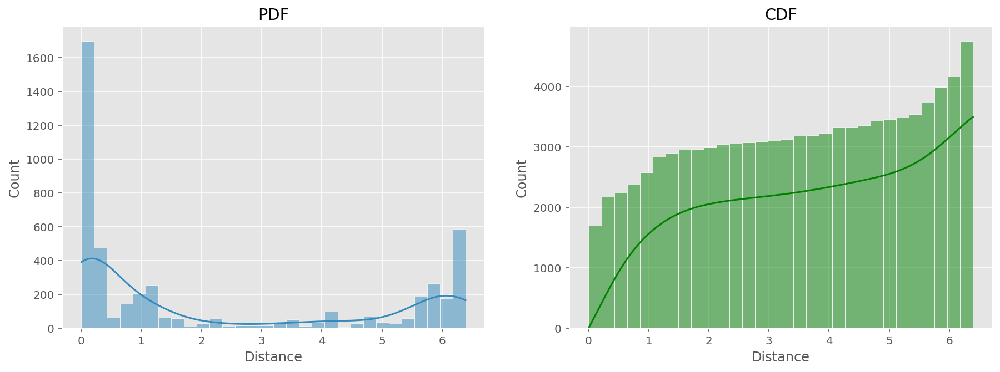

In [28]:
distances_distr_plot(Xt)

##### Estimate optimal number of clusters with elbow and Davies-Bouldin methods

  0%|          | 0/8 [00:00<?, ?it/s]

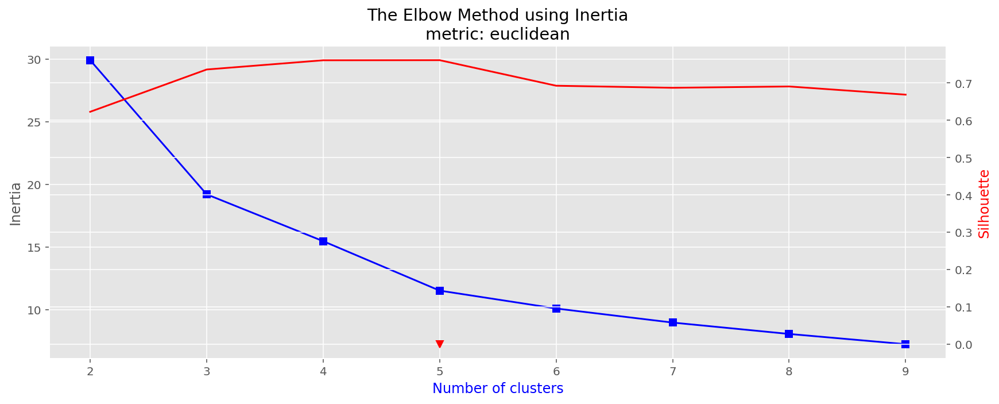

Optimal number of clusters: 5


In [29]:
n_clusters = elbow_study(Xt.T, metric="euclidean", model=KMeans)

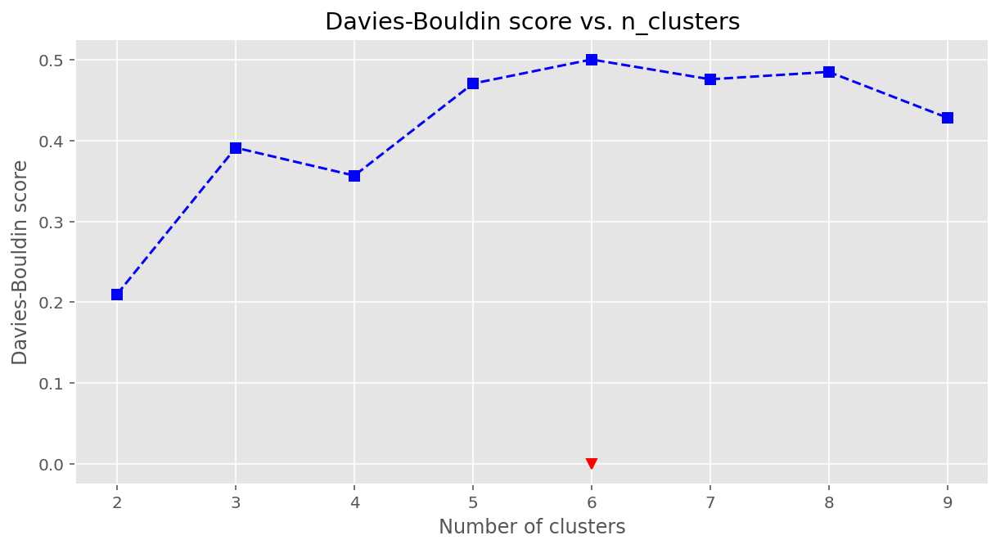

Optimal number of clusters: 6


In [30]:
n_clusters_dv = davies_bouldin_plot(Xt)

![slice4](https://drive.google.com/uc?export=download&id=1qFbd7HLrG88o7RbgexFUygDR2LP82O7-)

##### Plot clusters' charts - temporal domain, daily data

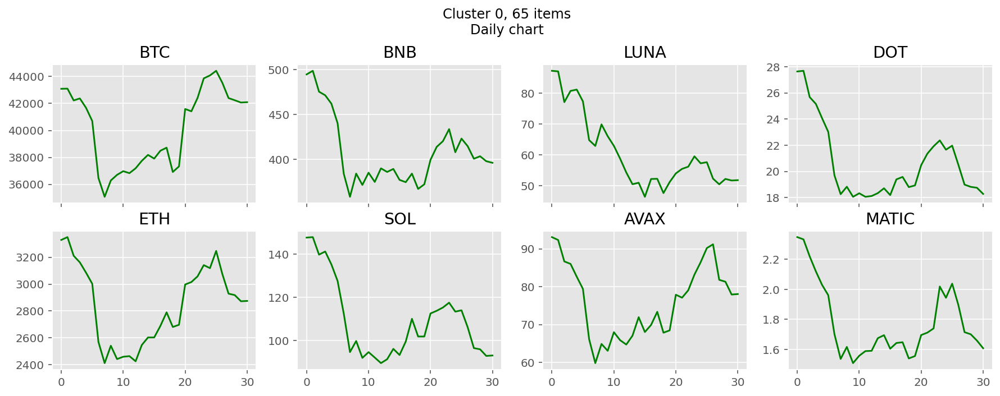

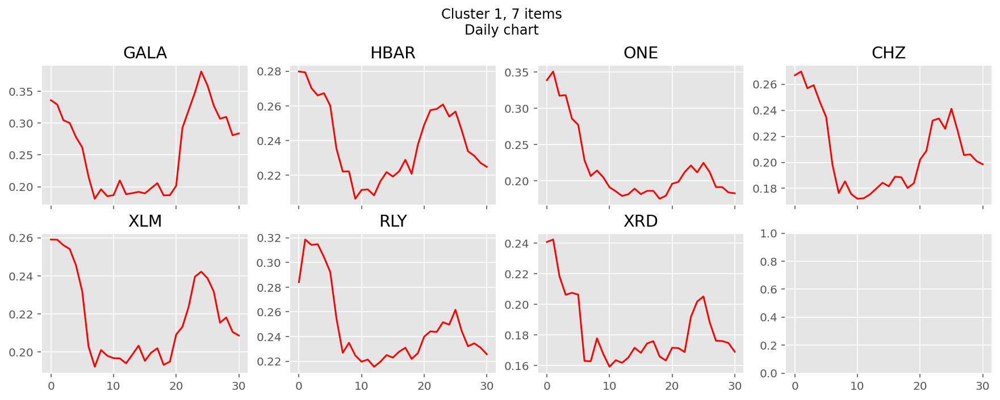

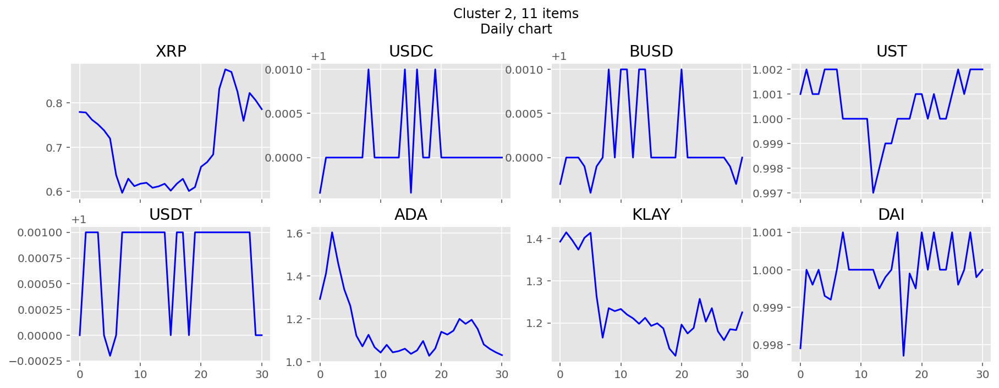

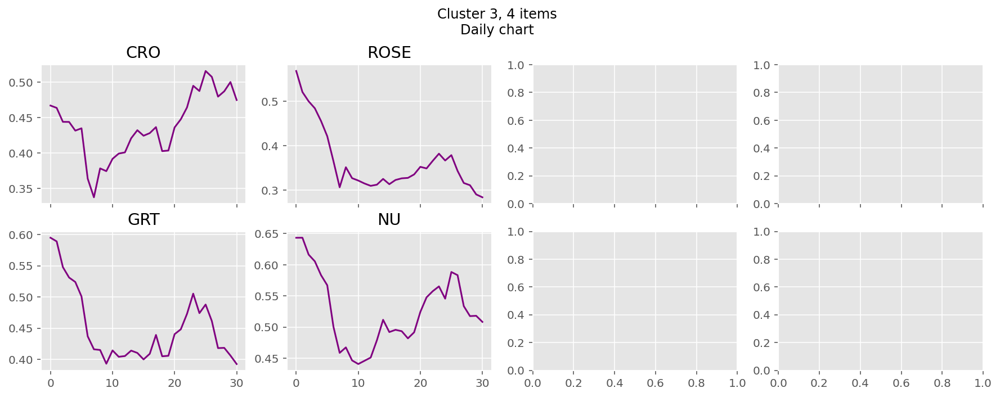

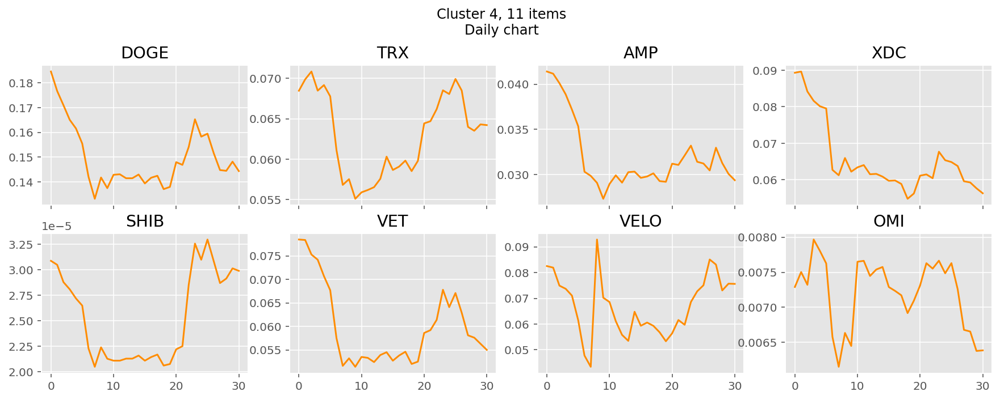

In [31]:
_=plot_clusters_2(
    data_day,
    Xt=Xt,
    n_clusters=n_clusters,
    random_state=random_state,
    title="Daily chart"
)

![slice4](https://drive.google.com/uc?export=download&id=1qFbd7HLrG88o7RbgexFUygDR2LP82O7-)
![slice5](https://drive.google.com/uc?export=download&id=1tO_u4a_RioPUolVviZLhJrriXe7kZ3XO) 

#### Spectral domain

In [32]:
cfg_file = tsfel.get_features_by_domain("spectral") #"spectral"

##### Extract features

In [33]:
x_temp = tsfel.time_series_features_extractor(cfg_file, data_day["BTC"], window_size=30) # <----------------------------- 30
tf_columns = x_temp.columns
xtf = pd.DataFrame(columns=data_day.columns, index=tf_columns)

# Scale prices?
dd = data_day.copy()
dd = pd.DataFrame(scaler.fit_transform(dd), columns=dd.columns, index=dd.index)

# Fill df with features
for col in xtf.columns:
    xtf[col] = tsfel.time_series_features_extractor(
        cfg_file, data_day[col], window_size=30 # <----------------------------- 30
    ).T
xtf.dropna(inplace=True)
Xt = pd.DataFrame(scaler.fit_transform(xtf), columns=data_day.columns, index=xtf.index)

*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***
*** Feature extraction started ***



*** Feature extraction finished ***


##### Estimate optimal number of clusters with elbow method

  0%|          | 0/8 [00:00<?, ?it/s]

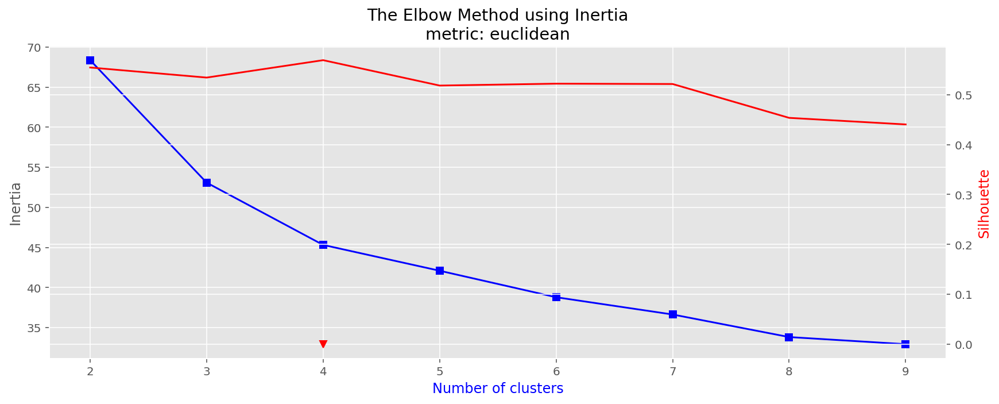

Optimal number of clusters: 4


In [34]:
n_clusters = elbow_study(Xt.T, metric="euclidean", model=KMeans)

##### Plot clusters' charts - spectral domain, daily data

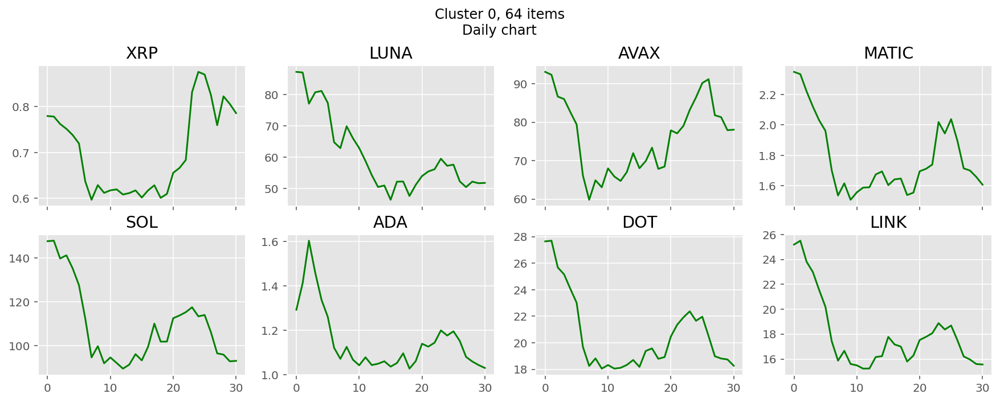

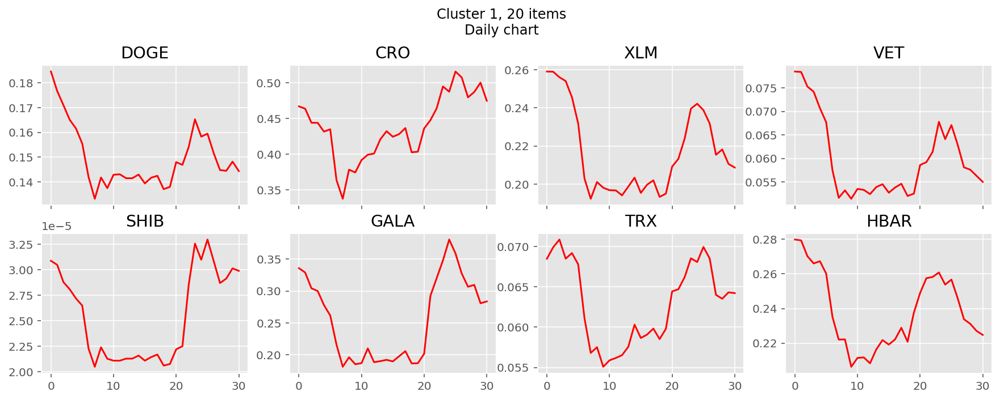

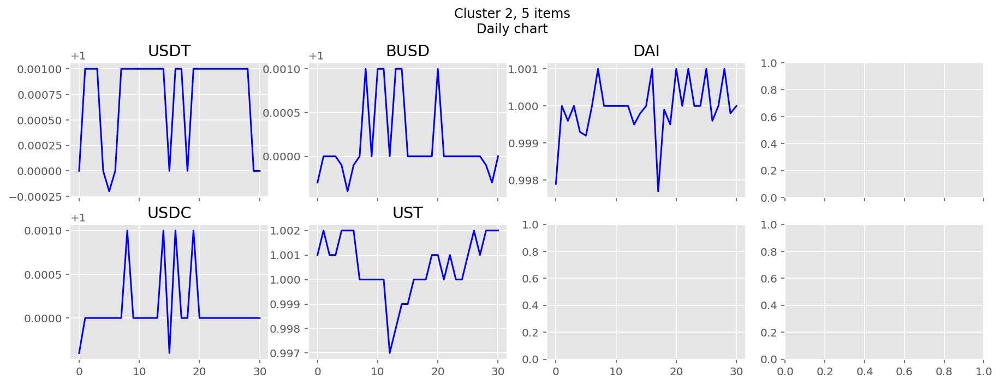

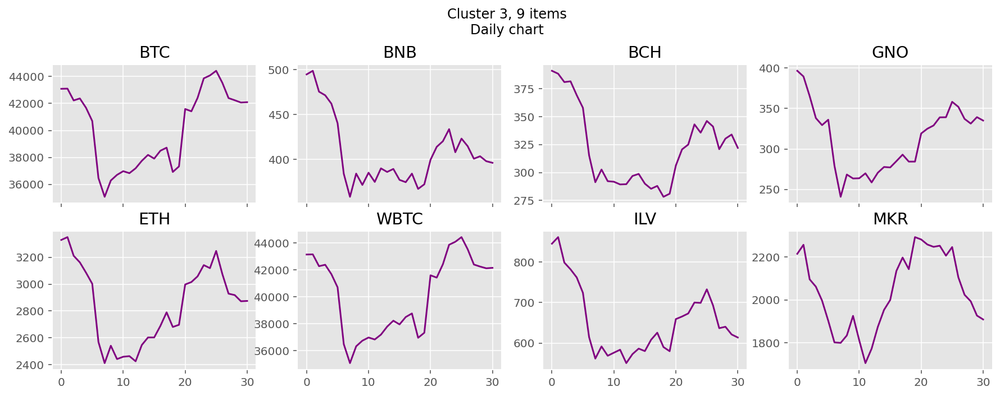

In [35]:
clustered_data = plot_clusters_2(
    data_day,
    Xt=Xt,
    n_clusters=n_clusters,
    random_state=random_state,
    title="Daily chart"
)

![slice5](https://drive.google.com/uc?export=download&id=1tO_u4a_RioPUolVviZLhJrriXe7kZ3XO) 

### Conclusion  
We can see that all clustering methods work quite well with both TSLEARN and TSFEL libraries, producing clusters with distinct common traits, so it is difficult to name the best approach.   

Most often the split is between:  
- BTC and alike, mostly major CCs with high market cap, usually the largest group
- Second-tier CCs with medium capitalization and lesser BTC correlation
- Small-cap cheap and volitile coins  
- Another group appears quite often: stablecoins like USDT, UST and alike with prices fluctuating around USD1.00.

### Practical application  
We will put clustering to test in a separate notebook, clustering_mef.ipynb: [![Binder](https://mybinder.org/badge_logo.svg)](https://mybinder.org/v2/gh/oort77/OTUS_ADV_HW3/main)  
The idea is to use CCs from two different clusters (computed in spectral domain to make things less obvious) to build a portfolio with lesser overall risk than, say, a portfolio with 5 top coins, namely BTC, ETH,	XRP, USDT, BNB. We will be able to judge the results by comparing the respective portfolios' plots of Markowitz Efficient Fronier.

![slice6](https://drive.google.com/uc?export=download&id=1updrFKIPTzfVguR8_FQ8kTklpbvIrDqo)